In [33]:
# Manipulation des fichiers
import os
from pathlib import Path
import pickle

# manipulation des données tabulaires
import pandas as pd
import numpy as np

# Manipulation des images
import cv2

# Visualisation de données
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
%matplotlib inline
from tqdm.notebook  import tqdm

## Explicabilité des modèles
from lime import lime_image
from skimage import segmentation

# Fonctions de chargement des données
import FETCH_LOAD_DATAS_p6

In [2]:
# paramètres d'affichage général

pd.set_option('display.max_rows', 120)


import warnings
warnings.filterwarnings("ignore")

In [3]:
# contrôle de la reproductibilité des résultats aléatoires

SEED = 49

In [4]:
# fonction de sauvegarde des illustrations

IMAGES_PATH = Path() / "img_results"
IMAGES_PATH.mkdir(parents=True, exist_ok=True)

ID_FIG = 0

def save_fig(fig_title, resolution=300):
    fig_id = str(globals()['ID_FIG'])
    path = IMAGES_PATH / f"{fig_id} - {fig_title}.png"
    globals()['ID_FIG']+=1
    plt.savefig(path, format='png', dpi=resolution)

In [5]:
# fonctions de sauvegarde et chargement des résultats

INTER_RESULTS_PATH = Path() / "results"
INTER_RESULTS_PATH.mkdir(parents=True, exist_ok=True)

def save_pickle(results, file_name):
    file_path = INTER_RESULTS_PATH / f"{file_name}.pkl"
    filehandler = open(file_path,"wb")
    pickle.dump(results, filehandler)
    filehandler.close()
    print(f"Fichier enregistré sous le nom '{file_name}' ")

def load_pickle(file_name):
    file_path = INTER_RESULTS_PATH / f"{file_name}.pkl"
    file = open(file_path,'rb')
    globals()[file_name] = pickle.load(file)
    file.close()
    print(f"Variable créée sous le nom '{file_name}' ")

# Exploration du jeu de données

## Informations générales sur le jeu

In [6]:
# cellule à n'exécuter qu'une seule fois au démarrage du projet pour télécharger les images (nécessite une connexion internet)
# FETCH_LOAD_DATAS_p6.fetch_dogs_data()

In [7]:
df_breed = FETCH_LOAD_DATAS_p6.load_dogs_data()

In [8]:
df_breed

,file_name,file_path,breed
0,n02085620_10074.jpg,datas/Images\n02085620-Chihuahua\n02085620_100...,Chihuahua
0,n02085620_10131.jpg,datas/Images\n02085620-Chihuahua\n02085620_101...,Chihuahua
0,n02085620_10621.jpg,datas/Images\n02085620-Chihuahua\n02085620_106...,Chihuahua
0,n02085620_1073.jpg,datas/Images\n02085620-Chihuahua\n02085620_107...,Chihuahua
0,n02085620_10976.jpg,datas/Images\n02085620-Chihuahua\n02085620_109...,Chihuahua
...,...,...,...
0,n02116738_9798.jpg,datas/Images\n02116738-African_hunting_dog\n02...,African_hunting_dog
0,n02116738_9818.jpg,datas/Images\n02116738-African_hunting_dog\n02...,African_hunting_dog
0,n02116738_9829.jpg,datas/Images\n02116738-African_hunting_dog\n02...,African_hunting_dog
0,n02116738_9844.jpg,datas/Images\n02116738-African_hunting_dog\n02...,African_hunting_dog


In [9]:
df_breed['breed'].value_counts()

Maltese_dog                       252
Afghan_hound                      239
Scottish_deerhound                232
Pomeranian                        219
Bernese_mountain_dog              218
Samoyed                           218
Irish_wolfhound                   218
Shih                              214
Great_Pyrenees                    213
Leonberg                          210
basenji                           209
Tibetan_terrier                   206
Sealyham_terrier                  202
EntleBucher                       202
Airedale                          202
pug                               200
Saluki                            200
cairn                             197
Lakeland_terrier                  197
Australian_terrier                196
papillon                          196
chow                              196
Norwegian_elkhound                196
beagle                            195
Newfoundland                      195
Siberian_husky                    192
Ibizan_hound

In [10]:
df_breed['breed'].value_counts().mean()

171.5

In [11]:
df_breed['breed'].value_counts().min()

148

In [12]:
df_breed['breed'].value_counts().max()

252

<Axes: ylabel='Count'>

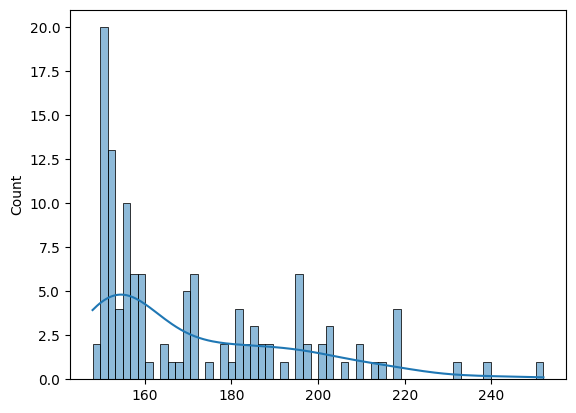

In [13]:
sns.histplot(df_breed['breed'].value_counts().values, bins=60, kde=True)

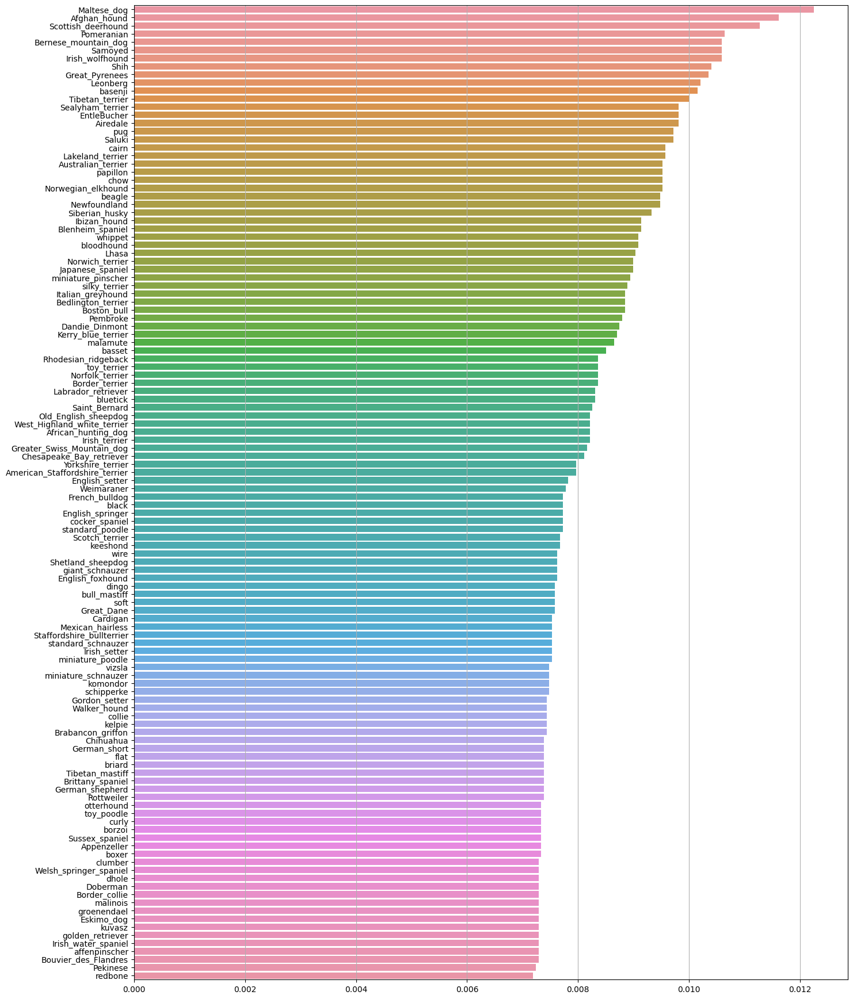

In [14]:
plt.figure(figsize=(16,22))
sns.barplot(x=df_breed['breed'].value_counts(normalize=True).values, y=df_breed['breed'].value_counts(normalize=True).index)
plt.grid(axis='x')

## Exploration des images

Nous allons définir 2 fonctions utiles pour la suite de notre travail :

   1. la première pour charger une image avec la librairie *OpenCV* depuis un fichier
   2. la seconde pour afficher une ou plusieurs images à la fois

In [15]:
def load_img(file, ext=['.png','.jpg','.jpeg','.JPG']):
    """
        Objectif : 
            charger une image avec la librairie OpenCV depuis un fichier image en local
        
        Arguments:
            file : chemin d'accès au fichier image à charger
            ext : liste des extensions de fichiers supportées
        
        Valeur retournée:
            img : objet image affichable
    """
    
    if file.endswith(tuple(ext)):
        img = cv2.imread(file, cv2.IMREAD_UNCHANGED)
        if len(img.shape) > 2:
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        return img
    else:
        print("file extension unknown")

In [194]:
def plot_imgs(imgs, titles=[]):
    """
        Objectif : 
            Afficher une ou plusieurs images à la fois
        
        Arguments:
            imgs : liste d'objets image
            titles : liste des titres associés aux objets image
        
        Valeur retournée:
            None : affiche la ou les images
    """
        
    if (len(imgs) == 1) or (type(imgs) not in [list,pd.core.series.Series]):
        img = imgs if type(imgs) is not list else imgs[0]
        title = None if len(titles) == 0 else (titles[0] if type(titles) is list else titles)
        plt.figure(figsize=(5,3))
        plt.suptitle(title, fontsize=15)
        if len(img.shape) > 2:
            plt.imshow(img)
        else:
            plt.imshow(img, cmap=plt.cm.binary)

    else:
        
        if len(imgs)%5 == 0:
            nrows = len(imgs)//5
            nb_cols_last_rows = 5
        else :
            nrows = len(imgs)//5 + 1
            nb_cols_last_rows = len(imgs)%5
        
        titles = None if len(titles) == 0 else (titles[0] if type(titles) is list and len(titles)==1 else titles)
        
        for i in range(nrows):
            if i != (nrows-1):
                fig, axes = plt.subplots(nrows=1, ncols=5, figsize=(25,5))
            else:
                fig, axes = plt.subplots(nrows=1, ncols=nb_cols_last_rows, figsize=(5*nb_cols_last_rows,5))

            for j, img in enumerate(imgs[5*i:5*(i+1)]):
                ax = axes[j] if type(axes) == np.ndarray else axes
                if len(img.shape) > 2:
                    ax.imshow(img)
                else:
                    ax.imshow(img, cmap=plt.cm.binary)

                ax.set_title(titles[5*i+j], fontsize=18)
            
    plt.tight_layout()
    plt.show()

In [17]:
img = load_img(df_breed['file_path'].sample(1)[0])

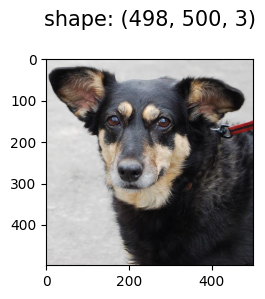

In [18]:
plot_imgs(img, "shape: "+str(img.shape))

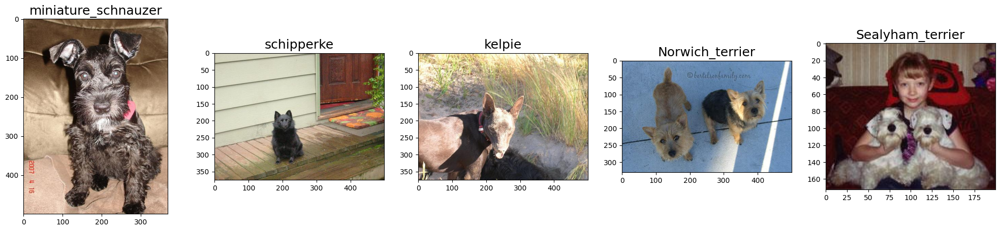

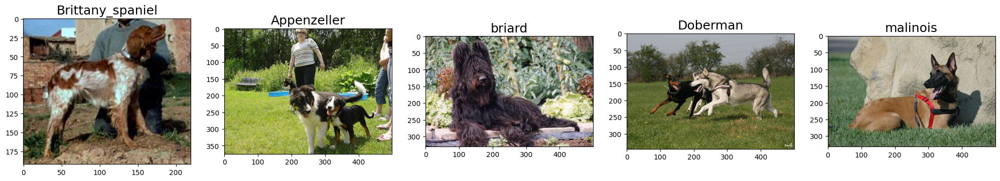

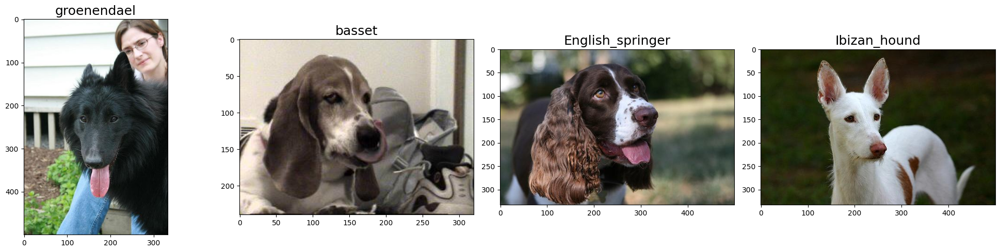

In [195]:
samples = df_breed.sample(14)
imgs = [load_img(img_path) for img_path in samples['file_path'].values]
# plot_imgs(imgs, titles=["shape: "+str(img.shape) for img in imgs])
plot_imgs(imgs, titles=samples['breed'].values)

Nous pouvons constater que les images sont de qualité similaire mais qu'elles diffèrent franchement en dimensions.
Nous aurons donc à les redimensionner.


## Limitations des ressources de calcul

Afin d'accélérer les temps de calcul nécessaire aux entraînement de nos modèles par la suite, nous allons limiter le nombre de races de chiens différentes dans notre jeu de données. Ainsi nous allons conserver **10 races de chiens**, tirées au hasard, et lorsque nous aurons defini un modèle optimal, nous l'entraînerons sur le jeu de données complet

In [56]:
rng = np.random.default_rng()
list_10_breeds = rng.choice(df_breed['breed'].unique(), size=10, replace=False)
list_10_breeds

array(['toy_poodle', 'Rhodesian_ridgeback', 'Irish_wolfhound',
       'schipperke', 'Australian_terrier', 'bloodhound',
       'African_hunting_dog', 'basset', 'Chesapeake_Bay_retriever',
       'Staffordshire_bullterrier'], dtype=object)

In [57]:
save_pickle(list_10_breeds, "list_10_breeds")

Fichier enregistré sous le nom 'list_10_breeds' 


In [201]:
df_10_breeds = df_breed[df_breed['breed'].isin(list_10_breeds)].sort_values(by="breed")
df_10_breeds

,file_name,file_path,breed
0,n02116738_9924.jpg,datas/Images\n02116738-African_hunting_dog\n02...,African_hunting_dog
0,n02116738_3422.jpg,datas/Images\n02116738-African_hunting_dog\n02...,African_hunting_dog
0,n02116738_3365.jpg,datas/Images\n02116738-African_hunting_dog\n02...,African_hunting_dog
0,n02116738_328.jpg,datas/Images\n02116738-African_hunting_dog\n02...,African_hunting_dog
0,n02116738_3160.jpg,datas/Images\n02116738-African_hunting_dog\n02...,African_hunting_dog
...,...,...,...
0,n02113624_5442.jpg,datas/Images\n02113624-toy_poodle\n02113624_54...,toy_poodle
0,n02113624_5386.jpg,datas/Images\n02113624-toy_poodle\n02113624_53...,toy_poodle
0,n02113624_5367.jpg,datas/Images\n02113624-toy_poodle\n02113624_53...,toy_poodle
0,n02113624_5723.jpg,datas/Images\n02113624-toy_poodle\n02113624_57...,toy_poodle


### Chargement des fichiers en image

In [202]:
df_10_breeds["img"] = df_10_breeds['file_path'].apply(lambda x: load_img(x))

In [204]:
# df_10_breeds.to_pickle("results/df_10_breeds.pkl")
df = pd.read_pickle("results/df_10_breeds.pkl")

### Équilibre du jeu de données

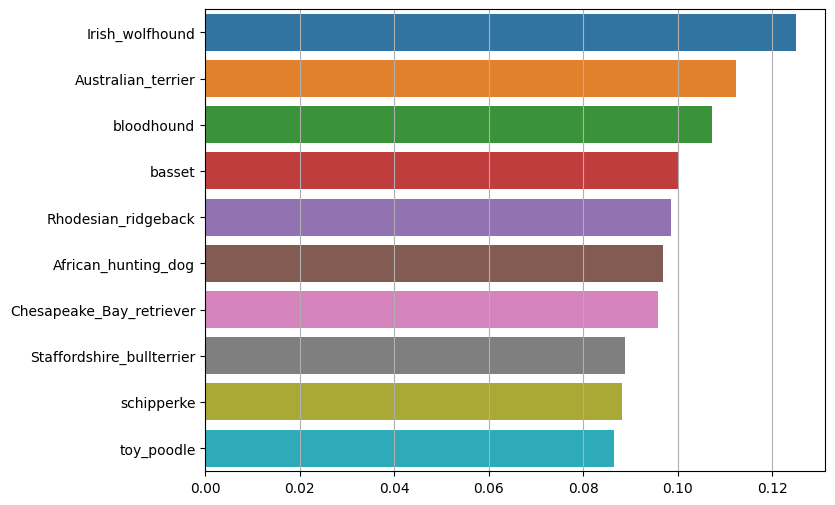

In [205]:
plt.figure(figsize=(8,6))
sns.barplot(x=df['breed'].value_counts(normalize=True).values, y=df['breed'].value_counts(normalize=True).index)
plt.grid(axis='x')

Notre nouveau jeu de données est légèrement déséquilibré.
En tirant au hasard les races de chiens à conserver, c'est ce que nous cherchions, car nous allons entraîner un modèle qui sera amené à travailler sur un plus grand jeu de données, lui aussi déséquilibré.

# Pré-traitement des données

## Redimensionnement des images

Pour entraîner nos modèles, il faut que toutes les images en entrée aient les mêmes dimensions.
Pour limiter la distorsion de celles-ci, nous allons d'abord observer la dispersion des dimensions des images de notre jeu.

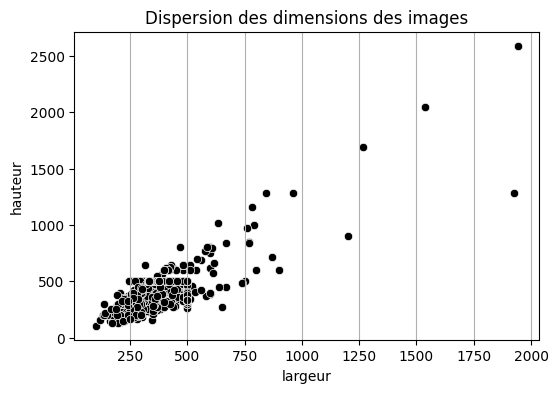

In [119]:
width = [img.shape[0] for img in df["img"]]
height = [img.shape[1] for img in df["img"]]

fig, ax = plt.subplots(figsize=(6,4))

sns.scatterplot(x=width, y=height, color="black", ax=ax)
ax.set(xlabel='largeur', ylabel="hauteur", title="Dispersion des dimensions des images")
ax.grid(axis='x')

plt.show()

Il semble y avoir 2 frontières : pour **x = 500** et **y =500**, on zoome pour s'en assurer.

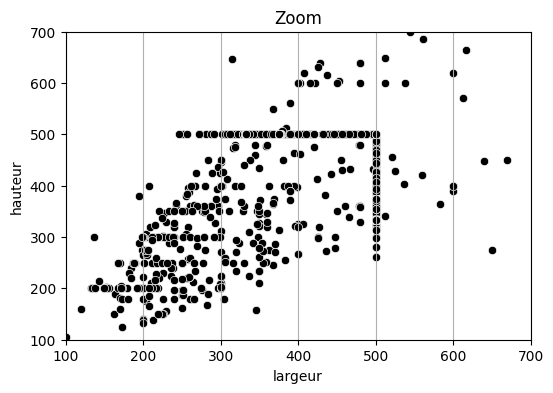

In [120]:
fig, ax = plt.subplots(figsize=(6, 4))

sns.scatterplot(x=width, y=height, color="black", ax=ax)
ax.set(xlabel='largeur', ylabel="hauteur", xlim=[100,700], ylim=[100,700], title="Zoom")
ax.grid(axis='x')

plt.show()

Observation confirmée par ce zoom.
Vérifions le par le calcul :

In [ ]:
df['width'] = df['img'].apply(lambda x: x.shape[0])
df['heigth'] = df['img'].apply(lambda x: x.shape[1])

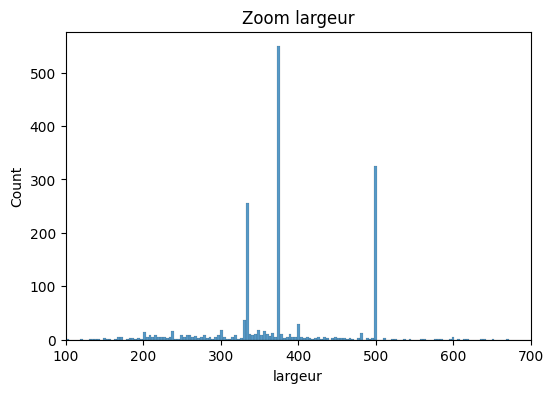

In [109]:
fig, ax = plt.subplots(figsize=(6,4))

sns.histplot(df['width'], bins=500, ax=ax)
ax.set(xlabel='largeur', xlim=[100,700], title="Zoom largeur")

plt.show()

In [111]:
df['width'].mode()

0    375
Name: width, dtype: int64

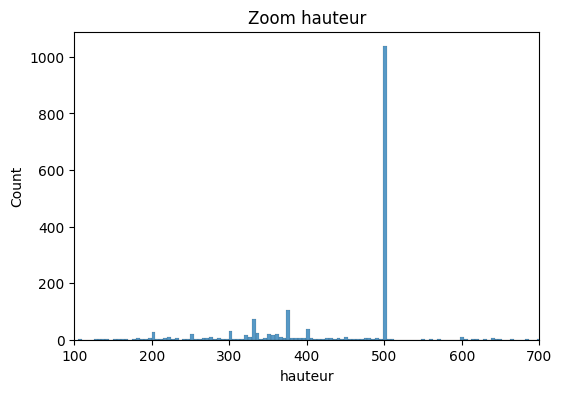

In [110]:
fig, ax = plt.subplots(figsize=(6,4))

sns.histplot(df['heigth'], bins=500, ax=ax)
ax.set(xlabel='hauteur', xlim=[100,700], title="Zoom hauteur")

plt.show()

In [112]:
df['heigth'].mode()

0    500
Name: heigth, dtype: int64

Nous choisissons donc de redimensionner toutes nos images vers les valeurs :  **375 * 500**

In [206]:
img_resize = (375,500)
df["img_resized"] = df["img"].apply(lambda x: cv2.resize(x, img_size))

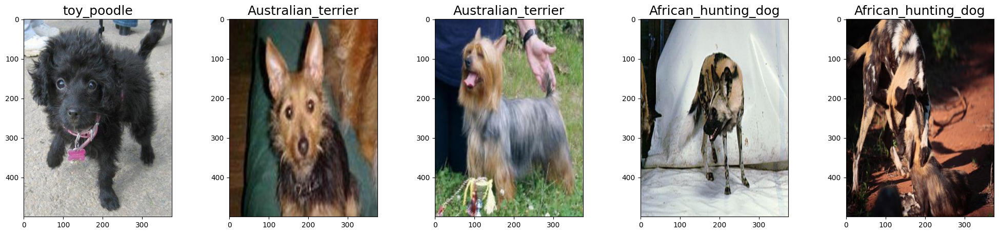

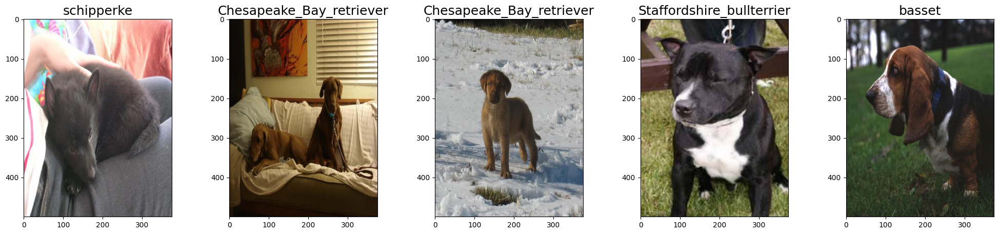

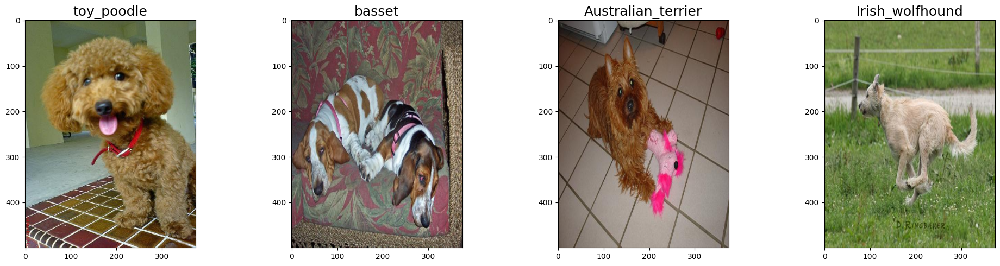

In [207]:
samples = df.sample(14)
plot_imgs(samples['img_resized'].to_list(), titles=samples['breed'].values)

## Mise à l'échelle des images

In [208]:
df["img_resized_scaled"] = df["img_resized"]/255

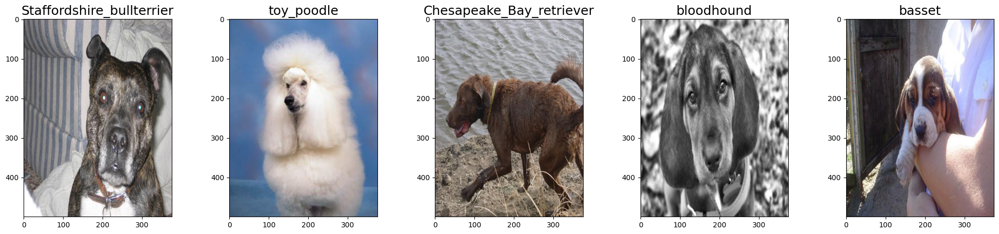

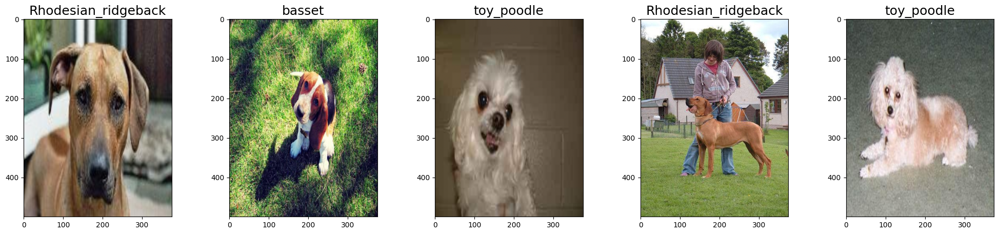

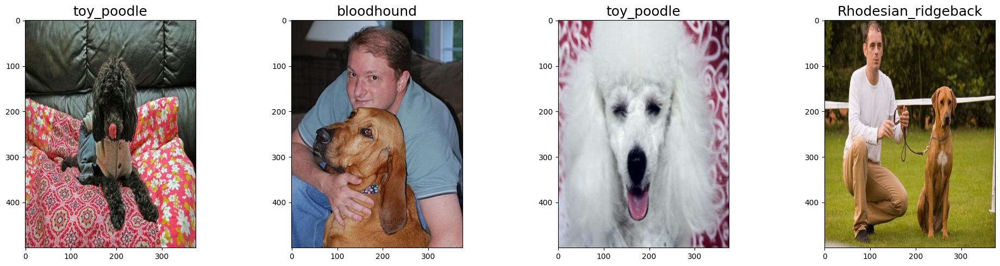

In [210]:
samples = df.sample(14)
plot_imgs(samples['img_resized_scaled'].to_list(), titles=samples['breed'].values)

## Séparation jeu d'entraînement / jeu de test

Nos images étant en quantité limitée, nous optons pour une séparation **90% / 10%**.

In [211]:
from sklearn.preprocessing import OrdinalEncoder

ord_enc = OrdinalEncoder()

df['breed_id'] = ord_enc.fit_transform(pd.DataFrame(df['breed']))

In [212]:
dict_breed_id = {i:df["breed"].unique()[i] for i in range(10)}
save_pickle(dict_breed_id, "dict_breed_id")

Fichier enregistré sous le nom 'dict_breed_id' 


In [176]:
df.head()

,file_name,img,breed,img_resized,img_resized_scaled,breed_id
0,n02116738_9924.jpg,"[[[189, 197, 199], [190, 198, 200], [191, 199,...",African_hunting_dog,"[[[189, 197, 199], [190, 198, 200], [190, 199,...","[[[0.7411764705882353, 0.7725490196078432, 0.7...",0.0
0,n02116738_3422.jpg,"[[[0, 3, 14], [18, 22, 33], [2, 6, 18], [0, 4,...",African_hunting_dog,"[[[3, 6, 17], [10, 14, 25], [0, 4, 16], [6, 12...","[[[0.011764705882352941, 0.023529411764705882,...",0.0
0,n02116738_3365.jpg,"[[[205, 194, 162], [198, 187, 157], [192, 181,...",African_hunting_dog,"[[[205, 194, 162], [200, 189, 158], [194, 183,...","[[[0.803921568627451, 0.7607843137254902, 0.63...",0.0
0,n02116738_328.jpg,"[[[252, 213, 154], [228, 189, 132], [239, 199,...",African_hunting_dog,"[[[252, 213, 154], [237, 198, 140], [232, 193,...","[[[0.9882352941176471, 0.8352941176470589, 0.6...",0.0
0,n02116738_3160.jpg,"[[[39, 51, 47], [38, 50, 46], [37, 49, 45], [3...",African_hunting_dog,"[[[39, 51, 47], [37, 49, 45], [35, 47, 43], [3...","[[[0.15294117647058825, 0.2, 0.184313725490196...",0.0


In [166]:
from sklearn.model_selection import train_test_split

In [188]:
X_train, X_test, y_train, y_test = train_test_split(df["img_resized_scaled"], df['breed_id'], train_size=0.9, random_state=SEED)

In [190]:
X_train.to_pickle("results/X_train.pkl")
X_test.to_pickle("results/X_test.pkl")
y_train.to_pickle("results/y_train.pkl")
y_test.to_pickle("results/y_test.pkl")